/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_45886/3409159160.py:272: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 1])


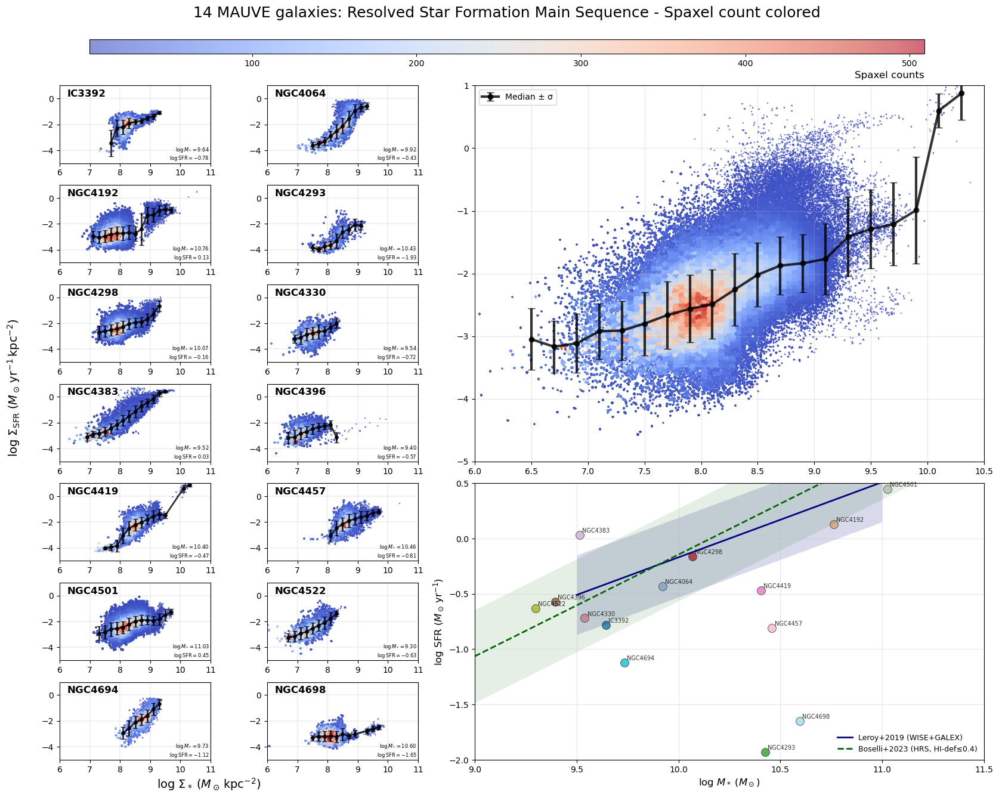

In [1]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rSFMS - [O/H] colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        oh_o3n2m13 = h['O_H_O3N2_M13_SF'].data
    return sigM, sigSFR, oh_o3n2m13

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_o3n2m13 = load_maps(gal)
    
    good = np.isfinite(sigM) & np.isfinite(sigSFR) & np.isfinite(oh_o3n2m13)
    
    if not np.any(good):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_vals, y_vals, oh_vals = sigM[good], sigSFR[good], oh_o3n2m13[good]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_vals, y_vals)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_vals)))
    
    # Density-based scatter for individual galaxies
    H, xedges, yedges = np.histogram2d(x_vals, y_vals, bins=50, range=[[6, 11], [-5, 1]])
    x_idx = np.clip(np.digitize(x_vals, xedges) - 1, 0, H.shape[0] - 1)
    y_idx = np.clip(np.digitize(y_vals, yedges) - 1, 0, H.shape[1] - 1)
    density = H[x_idx, y_idx]
    
    # Scatter plot colored by density
    scatter = axP.scatter(x_vals, y_vals, c=density, s=1, alpha=0.6, marker=',', 
                         cmap='coolwarm')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = f'$\\log M_* = {total_mass:.2f}$\n$\\log \\mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_oh = [], [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, oh_o3n2m13 = load_maps(gal)
    good = np.isfinite(sigM) & np.isfinite(sigSFR) & np.isfinite(oh_o3n2m13)
    
    if np.any(good):
        x_vals, y_vals, oh_vals = sigM[good], sigSFR[good], oh_o3n2m13[good]
        all_x.extend(x_vals)
        all_y.extend(y_vals)
        all_oh.extend(oh_vals)
        galaxy_counts[gal] = len(x_vals)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_oh = np.array(all_x), np.array(all_y), np.array(all_oh)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[6, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

# Scatter plot colored by density for combined data
scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')
ax_combined.legend(fontsize=10, loc='upper left')

ax_combined.set_xlim(6.0, 10.5)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Global SFMS plot - Lower panel
ax_sfms = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3

# SFMS relation functions
def sfms_leroy2019(logM, scatter=0.36, valid=(9.5, 11.0)):
    """Leroy+2019 eq.19 converted to log SFR: logSFR = 0.68*logM - 6.97."""
    y = 0.68 * np.asarray(logM) - 6.97
    y = np.where((logM < valid[0]) | (logM > valid[1]), np.nan, y)
    return y

def sfms_boselli2023(logM, slope=0.92, intercept=-1.57, x_pivot=8.451, scatter=0.42):
    """Boselli+2023 (HRS, HI-def ≤ 0.4): fit with pivot x_pivot."""
    logM = np.asarray(logM)
    y = slope * (logM - x_pivot) + intercept
    return y

# Extract total masses and SFRs for global SFMS
log_masses = []
log_sfrs = []
sfms_galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        sfms_galaxy_names.append(gal)

log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(sfms_galaxy_names)))

# Plot points and add galaxy names
for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, sfms_galaxy_names)):
    ax_sfms.scatter(mass, sfr, s=100, c=[colors_total[i]], alpha=0.8, 
                   edgecolors='black', linewidth=0.5)
    ax_sfms.annotate(gal, (mass, sfr), xytext=(3, 3), textcoords='offset points', 
                    fontsize=7, alpha=0.8)

# Add SFMS relations
x_line = np.linspace(9, 11.5, 400)

# Leroy+2019 line + ±0.36 dex band
y_l19 = sfms_leroy2019(x_line)
ax_sfms.plot(x_line, y_l19, lw=2, ls='-', label='Leroy+2019 (WISE+GALEX)', color='navy')
ax_sfms.fill_between(x_line, y_l19 - 0.36, y_l19 + 0.36, alpha=0.15, linewidth=0, color='navy')

# Boselli+2023 line + intrinsic-scatter band
y_b23 = sfms_boselli2023(x_line)
ax_sfms.plot(x_line, y_b23, lw=2, ls='--', label='Boselli+2023 (HRS, HI-def≤0.4)', color='darkgreen')
ax_sfms.fill_between(x_line, y_b23 - 0.42, y_b23 + 0.42, alpha=0.10, linewidth=0, color='darkgreen')

# Formatting
ax_sfms.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax_sfms.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax_sfms.grid(True, alpha=0.3)
ax_sfms.set_xlim(9, 11.5)
ax_sfms.set_ylim(-2, 0.5)
ax_sfms.legend(frameon=False, fontsize=9, loc='lower right')

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label(r'Spaxel counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Star Formation Main Sequence - Spaxel count colored', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

fig.tight_layout(rect=[0, 0, 1, 1])
# fig.savefig('Plot_20251117_MAUVE_Monthly_Meetiing/MAUVE_MUSE_rSFMS_SF.png', dpi=600)
# fig.savefig('Plot_20251117_MAUVE_Monthly_Meetiing/MAUVE_MUSE_rSFMS_SF.pdf')
plt.show()


STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...
  IC3392: HII=14884 pixels
  NGC4064: HII=7067 pixels
  NGC4192: HII=145944 pixels
  NGC4293: HII=5715 pixels
  NGC4298: HII=156350 pixels
  NGC4192: HII=145944 pixels
  NGC4293: HII=5715 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42998 pixels
  NGC4383: excluded from analysis
  NGC4396: HII=81745 pixels
  NGC4419: HII=7354 pixels
  NGC4330: HII=42998 pixels
  NGC4383: excluded from analysis
  NGC4396: HII=81745 pixels
  NGC4419: HII=7354 pixels
  NGC4457: HII=6310 pixels
  NGC4501: HII=261083 pixels
  NGC4457: HII=6310 pixels
  NGC4501: HII=261083 pixels
  NGC4522: HII=39665 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10181 pixels

Total combined pixels (HII): 781881

STEP 2: Defining 8 SFR bins for rMZR

Σ_SFR bins:
  Number of bins: 8

8 SFR bins:
  Bin 1: <-3.5
  Bin 2: -3.5–-3.0
  Bin 3: -3.0–-2.5
  Bin 4: -2.5–-2.0
  Bin 5: -2.0–-1.5
  Bin 6: -1.5–-1.0
  Bin 7: -1.0–-0.5
  Bin 8: >-0.5

STEP

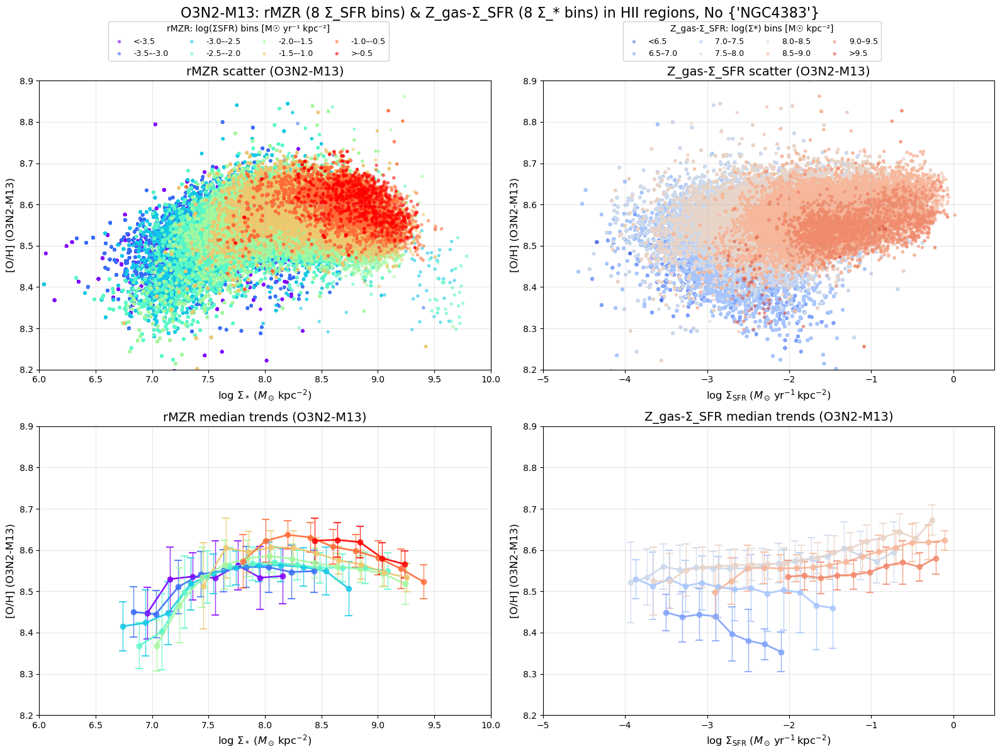


COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)
Successfully created 2x2 subplot figure showing HII regions from 13 galaxies
Galaxies included: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4330, NGC4396, NGC4419, NGC4457, NGC4501, NGC4522, NGC4694, NGC4698
Excluded: NGC4383

Panel summary:
  Top-left: rMZR scatter (8 Σ_SFR bins)
  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)
  Bottom-left: rMZR median trends (8 Σ_SFR bins)
  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)
  Shared y-range: 8.2 to 8.9


In [2]:
# ------------------------------------------------------------------
# Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# Using O3N2-M13 indicator only
# 2x2 subplot layout:
#   Top-left: rMZR scatter
#   Top-right: Z_gas-Σ_SFR scatter
#   Bottom-left: rMZR median trends
#   Bottom-right: Z_gas-Σ_SFR median trends
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_o3n2_m13(gal):
    """Load O3N2-M13 metallicity calibration for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
    return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in bins - only keep bins with >= 20 unique datapoints"""
    # Define bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
        # Select data in this bin
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}
included_galaxies = []

# ==============================================================================
# STEP 1: Collect all spaxels from all galaxies for HII regions
# ==============================================================================
all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_o3n2_m13_HII = []

print("="*80)
print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
print("="*80)

for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from analysis")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        included_galaxies.append(gal)
        # Load data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_o3n2_m13_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
    else:
        print(f"  {gal}: Data files not found")

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# ==============================================================================
# STEP 2: Define 8 Σ_SFR bins for rMZR analysis
# Bins: <-3.5, [-3.5,-3.0), [-3.0,-2.5), [-2.5,-2.0), [-2.0,-1.5), [-1.5,-1.0), [-1.0,-0.5), >=-0.5
# ==============================================================================
print("\n" + "="*80)
print("STEP 2: Defining 8 SFR bins for rMZR")
print("="*80)

# Define 8 bins with specific boundaries
n_bins = 8
# Bin edges: -inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, +inf
sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]

print(f"\nΣ_SFR bins:")
print(f"  Number of bins: {n_bins}")

# Create bin labels
bin_labels = [
    '<-3.5',
    '-3.5–-3.0',
    '-3.0–-2.5',
    '-2.5–-2.0',
    '-2.0–-1.5',
    '-1.5–-1.0',
    '-1.0–-0.5',
    '>-0.5'
]

print(f"\n8 SFR bins:")
for i, label in enumerate(bin_labels):
    print(f"  Bin {i+1}: {label}")

# Colors for different bins using rainbow colormap
colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# ==============================================================================
# STEP 3: Define 8 Σ_* bins for Z_gas-Σ_SFR analysis
# Bins: <6.5, [6.5,7.0), [7.0,7.5), [7.5,8.0), [8.0,8.5), [8.5,9.0), [9.0,9.5), >=9.5
# ==============================================================================
print("\n" + "="*80)
print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
print("="*80)

# Define 8 Σ_* bins with specific boundaries
n_bins_sigmaM = 8
# Bin edges: -inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, +inf
sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]

print(f"\nΣ_* bins:")
print(f"  Number of bins: {n_bins_sigmaM}")

# Create bin labels for Σ_* bins
bin_labels_sigmaM = [
    '<6.5',
    '6.5–7.0',
    '7.0–7.5',
    '7.5–8.0',
    '8.0–8.5',
    '8.5–9.0',
    '9.0–9.5',
    '>9.5'
]

print(f"\n8 Σ_* bins:")
for i, label in enumerate(bin_labels_sigmaM):
    print(f"  Bin {i+1}: {label}")

# Colors for 8 Σ_* bins: gradient from blue (low Σ_*) to red (high Σ_*)
colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# ==============================================================================
# STEP 4: Create combined 2x2 figure (rMZR & Z_gas-Σ_SFR)
# ==============================================================================
print("\n" + "="*80)
print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
print("="*80)

# Set uniform y-axis range
common_ylim = (8.2, 8.9)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Create figure with 2 rows x 2 columns 
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Use O3N2-M13 data
oh_data_HII = all_oh_o3n2_m13_HII
calib_name_HII = 'O3N2-M13'

print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")

# Assign axes (swap top-right with bottom-left)
ax_rMZR_scatter = axes[0, 0]
ax_Zgas_scatter = axes[0, 1]
ax_rMZR_median = axes[1, 0]
ax_Zgas_median = axes[1, 1]

# =============================================================================
# TOP ROW LEFT: rMZR scatter (in 8 Σ_SFR bins)
# =============================================================================
print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")

legend_handles_sfr = []
legend_labels_sfr = []

valid_bins_rMZR = 0
for i in range(n_bins):
    # HII regions processing - handle all bins uniformly
    in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
    
    n_pixels_HII = np.sum(in_bin_HII)
    
    if n_pixels_HII >= 10:
        # Get data for this bin (x=Σ_*, y=[O/H])
        x_bin_HII = all_logSigmaM_HII[in_bin_HII]
        y_bin_HII = oh_data_HII[in_bin_HII]
        
        # Scatter plot
        scatter_hii = ax_rMZR_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sfr[i]], s=15, alpha=0.6, 
                             edgecolors='none', rasterized=True)
        
        legend_handles_sfr.append(scatter_hii)
        legend_labels_sfr.append(bin_labels[i])
        
        # Median trends
        mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
            x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
        if len(mass_centers_HII) > 0:
            ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                       color=colors_sfr[i], marker='o', markersize=6, 
                       linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
            # Add lines between adjacent bins
            for j in range(len(valid_bin_indices_HII) - 1):
                current_bin_idx = valid_bin_indices_HII[j]
                next_bin_idx = valid_bin_indices_HII[j + 1]
                if next_bin_idx - current_bin_idx == 1:
                    ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                           [medians_HII[j], medians_HII[j + 1]], 
                           color=colors_sfr[i], linewidth=2, alpha=0.8)
            valid_bins_rMZR += 1

# Format rMZR scatter plot
ax_rMZR_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
ax_rMZR_scatter.set_title(f'rMZR scatter ({calib_name_HII})', fontsize=14)
ax_rMZR_scatter.grid(True, alpha=0.3)
ax_rMZR_scatter.set_xlim(6, 10)
ax_rMZR_scatter.set_ylim(common_ylim)

# =============================================================================
# BOTTOM ROW LEFT: rMZR median trends
# =============================================================================
ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
ax_rMZR_median.set_title(f'rMZR median trends ({calib_name_HII})', fontsize=14)
ax_rMZR_median.grid(True, alpha=0.3)
ax_rMZR_median.set_xlim(6, 10)
ax_rMZR_median.set_ylim(common_ylim)

print(f"  rMZR valid bins: {valid_bins_rMZR}")

# =============================================================================
# TOP ROW RIGHT: Z_gas-Σ_SFR scatter (in 8 Σ_* bins)
# =============================================================================
print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")

legend_handles_sigmaM = []
legend_labels_sigmaM_display = []

valid_bins_Zgas = 0
for i in range(n_bins_sigmaM):
    # HII regions processing - handle all bins uniformly
    in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i+1])
    
    n_pixels_HII = np.sum(in_bin_HII)
    
    if n_pixels_HII >= 10:
        # Get data for this bin (x=Σ_SFR, y=[O/H])
        x_bin_HII = all_logSigmaSFR_HII[in_bin_HII]
        y_bin_HII = oh_data_HII[in_bin_HII]
        
        # Scatter plot
        scatter_hii = ax_Zgas_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sigmaM[i]], s=15, alpha=0.6, 
                             edgecolors='none', rasterized=True)
        
        legend_handles_sigmaM.append(scatter_hii)
        legend_labels_sigmaM_display.append(bin_labels_sigmaM[i])
        
        # Median trends (now bin by Σ_SFR)
        sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
            x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
        if len(sfr_centers_HII) > 0:
            ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, 
                       color=colors_sigmaM[i], marker='o', markersize=6, 
                       linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
            # Add lines between adjacent bins
            for j in range(len(valid_bin_indices_HII) - 1):
                current_bin_idx = valid_bin_indices_HII[j]
                next_bin_idx = valid_bin_indices_HII[j + 1]
                if next_bin_idx - current_bin_idx == 1:
                    ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], 
                           [medians_HII[j], medians_HII[j + 1]], 
                           color=colors_sigmaM[i], linewidth=2, alpha=0.8)
            valid_bins_Zgas += 1

# Format Z_gas-Σ_SFR scatter plot
ax_Zgas_scatter.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax_Zgas_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
ax_Zgas_scatter.set_title(f'Z_gas-Σ_SFR scatter ({calib_name_HII})', fontsize=14)
ax_Zgas_scatter.grid(True, alpha=0.3)
ax_Zgas_scatter.set_xlim(-5.0, 0.5)
ax_Zgas_scatter.set_ylim(common_ylim)

# =============================================================================
# BOTTOM ROW RIGHT: Z_gas-Σ_SFR median trends
# =============================================================================
ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax_Zgas_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
ax_Zgas_median.set_title(f'Z_gas-Σ_SFR median trends ({calib_name_HII})', fontsize=14)
ax_Zgas_median.grid(True, alpha=0.3)
ax_Zgas_median.set_xlim(-5.0, 0.5)
ax_Zgas_median.set_ylim(common_ylim)

print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# Add overall title
fig.suptitle(f'{calib_name_HII}: rMZR (8 Σ_SFR bins) & Z_gas-Σ_SFR (8 Σ_* bins) in HII regions, No {excluded_galaxies}', 
             fontsize=16, y=0.995)

# Add legends - one for each row (positions unchanged)
legend1 = fig.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', 
                    bbox_to_anchor=(0.25, 0.98), ncol=4, fontsize=9, framealpha=0.9,
                    title='rMZR: log(ΣSFR) bins [M☉ yr⁻¹ kpc⁻²]', title_fontsize=10)
legend2 = fig.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', 
                    bbox_to_anchor=(0.75, 0.98), ncol=4, fontsize=9, framealpha=0.9,
                    title='Z_gas-Σ_SFR: log(Σ*) bins [M☉ kpc⁻²]', title_fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.savefig('Plot_20251117_MAUVE_Monthly_Meetiing/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_20251117_MAUVE_Monthly_Meetiing/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
plt.show()

print("\n" + "="*80)
print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
print("="*80)
print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
print(f"Galaxies included: {', '.join(included_galaxies)}")
print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
print("\nPanel summary:")
print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


In [3]:
# ------------------------------------------------------------------
# Interactive 3D rFMR plane: log Σ_* (x), log Σ_SFR (y), [O/H] (z)
# Color-coded by galaxy (HII regions, O3N2-M13), using Plotly
# Colors follow the same galaxy ordering as in Cell 1,
# including a reserved color slot for NGC4383 even if excluded.
# ------------------------------------------------------------------
import numpy as np
import pandas as pd
from pathlib import Path
from astropy.io import fits
import plotly.express as px

def load_maps_o3n2_m13_for_3d(gal):
    """Load Σ_*, Σ_SFR_HII, [O/H]_O3N2-M13 for a single galaxy (for 3D plot)."""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
    return sigM, sigSFR_HII, oh_o3n2_m13_HII

# Reuse the same galaxy list as in Cell 1, if available;
# otherwise reconstruct it in the same way for consistency.
try:
    galaxies_for_colors = galaxies  # from Cell 1
except NameError:
    bins_main = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
    galaxies_for_colors = [f.name.split('_')[0] for f in bins_main]

# Build an explicit, ordered color sequence matching Cell 1 style
# (Cell 1 uses plt.cm.tab20 over the discovered galaxies).
# We recreate that mapping here so colors are consistent.
import matplotlib.pyplot as plt
base_colors = plt.cm.tab20(np.linspace(0, 1, max(len(galaxies_for_colors), 1)))
color_discrete_map = {gal: f"rgba({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)}, {c[3]:.2f})"
                       for gal, c in zip(galaxies_for_colors, base_colors)}

# Discover galaxies for which we actually have HII-region data for 3D plot
bins_3d = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies_3d_all = [f.name.split('_')[0] for f in bins_3d]

# Use the same exclusion as in Cell 2 for the data,
# but keep its color slot in color_discrete_map (i.e., do NOT drop it).
excluded_galaxies_3d = {'NGC4383'}

records = []

for gal in galaxies_3d_all:
    if gal in excluded_galaxies_3d:
        # Skip its data but keep its color mapping intact
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    if not (bin_file.exists() and gas_file.exists()):
        continue

    sigM, sigSFR_HII, oh_o3n2_m13_HII = load_maps_o3n2_m13_for_3d(gal)
    mask = (np.isfinite(sigM) & np.isfinite(sigSFR_HII) & np.isfinite(oh_o3n2_m13_HII))

    if np.sum(mask) < 10:
        continue

    x = sigM[mask].ravel()
    y = sigSFR_HII[mask].ravel()
    z = oh_o3n2_m13_HII[mask].ravel()
    
    # Optionally subsample to keep the interactive plot responsive
    max_points_per_gal = 20000
    if x.size > max_points_per_gal:
        idx = np.random.choice(x.size, max_points_per_gal, replace=False)
        x = x[idx]
        y = y[idx]
        z = z[idx]

    for xv, yv, zv in zip(x, y, z):
        records.append({
            "logSigmaM": xv,
            "logSigmaSFR": yv,
            "OH_O3N2_M13": zv,
            "Galaxy": gal
        })

# Build DataFrame for Plotly
df_3d = pd.DataFrame.from_records(records)

if len(df_3d) == 0:
    print("No valid HII-region spaxels found for interactive 3D rFMR plot.")
else:
    # Ensure galaxies appear in the same order as in Cell 1
    category_order = {"Galaxy": galaxies_for_colors}
    
    fig = px.scatter_3d(
        df_3d,
        x="logSigmaM",
        y="logSigmaSFR",
        z="OH_O3N2_M13",
        color="Galaxy",
        opacity=0.5,
        size_max=6,
        symbol=None,
        color_discrete_map=color_discrete_map,
        category_orders=category_order,
    )
    
    # Make markers slightly larger for better visibility
    fig.update_traces(marker=dict(size=3))
    
    # Enlarge legend markers
    fig.update_layout(legend=dict(itemsizing="constant"))
    
    fig.update_layout(
        scene=dict(
            xaxis_title=r"log Σ_* (M_⊙ kpc⁻²)",
            yaxis_title=r"log Σ_SFR (M_⊙ yr⁻¹ kpc⁻²)",
            zaxis_title="[O/H] (O3N2-M13)",
            xaxis=dict(range=[6, 10]),
            yaxis=dict(range=[-5, 0.5]),
            zaxis=dict(range=[8.2, 8.9]),
        ),
        title="Resolved FMR in HII regions (O3N2-M13): interactive 3D view",
        legend_title_text="Galaxy",
    )
    
    # Set a nice initial camera view; user can drag to change
    fig.update_layout(scene_camera=dict(eye=dict(x=1.6, y=1.6, z=0.9)))
    
    fig.show()

In [4]:
# ------------------------------------------------------------------
# Interactive 3D rFMR plane: log Σ_* (x), log Σ_SFR (y), [O/H] (z)
# Color-coded by local spaxel density (coolwarm), HII regions only, O3N2-M13
# ------------------------------------------------------------------
import numpy as np
import pandas as pd
from pathlib import Path
from astropy.io import fits
import plotly.express as px

def load_maps_o3n2_m13_for_3d_density(gal):
    """Load Σ_*, Σ_SFR_HII, [O/H]_O3N2-M13 for a single galaxy (for 3D density plot)."""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
    return sigM, sigSFR_HII, oh_o3n2_m13_HII

# Discover galaxies
bins_3d = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies_3d_all = [f.name.split('_')[0] for f in bins_3d]

# Exclude NGC4383 for the data (as in previous cells)
excluded_galaxies_3d = {'NGC4383'}

all_x = []
all_y = []
all_z = []

for gal in galaxies_3d_all:
    if gal in excluded_galaxies_3d:
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    if not (bin_file.exists() and gas_file.exists()):
        continue

    sigM, sigSFR_HII, oh_o3n2_m13_HII = load_maps_o3n2_m13_for_3d_density(gal)
    mask = (np.isfinite(sigM) & np.isfinite(sigSFR_HII) & np.isfinite(oh_o3n2_m13_HII))

    if np.sum(mask) < 10:
        continue

    x = sigM[mask].ravel()
    y = sigSFR_HII[mask].ravel()
    z = oh_o3n2_m13_HII[mask].ravel()
    
    all_x.append(x)
    all_y.append(y)
    all_z.append(z)

if len(all_x) == 0:
    print("No valid HII-region spaxels found for interactive 3D rFMR density-colored plot.")
else:
    all_x = np.concatenate(all_x)
    all_y = np.concatenate(all_y)
    all_z = np.concatenate(all_z)
    
    # Compute 3D density in (Σ_*, Σ_SFR, [O/H]) space using a 3D histogram
    # Define bin edges
    x_bins = np.linspace(6.0, 10.0, 40)
    y_bins = np.linspace(-5.0, 0.5, 40)
    z_bins = np.linspace(8.2, 8.9, 30)
    
    H, edges = np.histogramdd(np.vstack([all_x, all_y, all_z]).T,
                               bins=(x_bins, y_bins, z_bins))
    
    # Map each point to its bin index to get density
    x_idx = np.clip(np.digitize(all_x, x_bins) - 1, 0, H.shape[0] - 1)
    y_idx = np.clip(np.digitize(all_y, y_bins) - 1, 0, H.shape[1] - 1)
    z_idx = np.clip(np.digitize(all_z, z_bins) - 1, 0, H.shape[2] - 1)
    density = H[x_idx, y_idx, z_idx]

    # Optionally subsample for interactivity while preserving density distribution
    max_points = 150000
    n_points = all_x.size
    if n_points > max_points:
        idx = np.random.choice(n_points, max_points, replace=False)
        all_x = all_x[idx]
        all_y = all_y[idx]
        all_z = all_z[idx]
        density = density[idx]
    
    df_density = pd.DataFrame({
        "logSigmaM": all_x,
        "logSigmaSFR": all_y,
        "OH_O3N2_M13": all_z,
        "Density": density,
    })
    
    fig = px.scatter_3d(
        df_density,
        x="logSigmaM",
        y="logSigmaSFR",
        z="OH_O3N2_M13",
        color="Density",
        color_continuous_scale="turbo",
        opacity=0.6,
    )
    
    fig.update_traces(marker=dict(size=2))
    
    fig.update_layout(
        scene=dict(
            xaxis_title=r"log Σ_* (M_⊙ kpc⁻²)",
            yaxis_title=r"log Σ_SFR (M_⊙ yr⁻¹ kpc⁻²)",
            zaxis_title="[O/H] (O3N2-M13)",
            xaxis=dict(range=[6, 10]),
            yaxis=dict(range=[-5, 0.5]),
            zaxis=dict(range=[8.2, 8.9]),
        ),
        title="Resolved FMR in HII regions (O3N2-M13): interactive 3D view, density-colored",
        coloraxis_colorbar=dict(title="Spaxel count"),
    )
    
    fig.update_layout(scene_camera=dict(eye=dict(x=1.6, y=1.6, z=0.9)))
    
    fig.show()